In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split

# --- 1. Definición de Patrones Base (10x10) ---
# 1 = verde, 0 = blanco

BASE_B = np.array([
    0,0,0,0,0,0,0,0,0,0,
    0,0,1,0,0,0,0,0,0,0,
    0,0,1,0,0,0,0,0,0,0,
    0,0,1,0,0,0,0,0,0,0,
    0,0,1,1,1,1,1,0,0,0,
    0,0,1,0,0,0,0,1,0,0,
    0,0,1,0,0,0,0,1,0,0,
    0,0,1,0,0,0,0,1,0,0,
    0,0,1,1,1,1,1,0,0,0,
    0,0,0,0,0,0,0,0,0,0
])

BASE_D = np.array([
    0,0,0,0,0,0,0,0,0,0,
    0,0,0,0,0,0,0,1,0,0,
    0,0,0,0,0,0,0,1,0,0,
    0,0,0,0,0,0,0,1,0,0,
    0,0,0,1,1,1,1,1,0,0,
    0,0,1,0,0,0,0,1,0,0,
    0,0,1,0,0,0,0,1,0,0,
    0,0,1,0,0,0,0,1,0,0,
    0,0,0,1,1,1,1,1,0,0,
    0,0,0,0,0,0,0,0,0,0
])

BASE_F = np.array([
    0,0,0,0,0,0,0,0,0,0,
    0,0,0,0,0,1,1,0,0,0,
    0,0,0,0,1,0,0,1,0,0,
    0,0,0,0,1,0,0,0,0,0,
    0,0,1,1,1,1,1,0,0,0,
    0,0,0,0,1,0,0,0,0,0,
    0,0,0,0,1,0,0,0,0,0,
    0,0,0,0,1,0,0,0,0,0,
    0,0,0,0,1,0,0,0,0,0,
    0,0,0,0,0,0,0,0,0,0
])

# Diccionario para acceder fácilmente a los patrones base
PATRONES_BASE = {
    'b': BASE_B,
    'd': BASE_D,
    'f': BASE_F
}
LETRAS = ['b', 'd', 'f']



In [ ]:
# --- 2. Función Auxiliar de Distorsión ---

def _crear_patron_distorsionado(base_pattern, min_dist=0.01, max_dist=0.30):
    """
    Función auxiliar para crear una única instancia de patrón distorsionado.
    Toma un patrón base y voltea un porcentaje aleatorio de píxeles (1% a 30%).
    """
    distorted_pattern = np.copy(base_pattern)
    num_pixels = len(distorted_pattern)

    # Elige un porcentaje de distorsión aleatorio entre 1% y 30%
    distortion_percent = np.random.uniform(min_dist, max_dist)
    num_to_flip = int(num_pixels * distortion_percent)

    if num_to_flip == 0:
        num_to_flip = 1

    indices_to_flip = np.random.choice(num_pixels, num_to_flip, replace=False)

    for idx in indices_to_flip:
        distorted_pattern[idx] = 1 - distorted_pattern[idx]

    return distorted_pattern

# --- 3. FUNCIÓN DE GENERACIÓN ---

def crear_dataset_completo(cantidad_total):
    """
    Genera un dataset completo y mezclado según las reglas del TP.

    Reglas:
    - 10% de patrones prístinos (sin distorsión)
    - 90% de patrones con distorsión (entre 1% y 30%)
    - Distribución equitativa de letras ('b', 'd', 'f') [cite: 16]

    Argumentos:
    cantidad_total (int): El número total de ejemplos (100, 500 o 1000)

    Retorna:
    pandas.DataFrame: Un DataFrame completo y mezclado.
    """

    print(f"Iniciando generación de dataset con {cantidad_total} elementos...")

    num_pristine = int(cantidad_total * 0.10)
    num_distorted = cantidad_total - num_pristine

    lista_de_datos = []

    # 1. Generar patrones prístinos
    for i in range(num_pristine):
        letra = LETRAS[i % 3] # Cicla 'b', 'd', 'f'
        patron = PATRONES_BASE[letra]
        lista_de_datos.append((patron, letra))

    # 2. Generar patrones distorsionados
    for i in range(num_distorted):
        letra = LETRAS[i % 3] # Cicla 'b', 'd', 'f'
        patron_base = PATRONES_BASE[letra]
        patron = _crear_patron_distorsionado(patron_base, 0.01, 0.30)
        lista_de_datos.append((patron, letra))

    print(f"Generados {len(lista_de_datos)} patrones: {num_pristine} prístinos y {num_distorted} distorsionados.")

    # 3. Crear el DataFrame completo
    columnas_pixeles = [f'p{i}' for i in range(100)]
    columnas_df = columnas_pixeles + ['letra']

    data_para_df = [list(patron) + [letra] for patron, letra in lista_de_datos]
    df_completo = pd.DataFrame(data_para_df, columns=columnas_df)

    # 4. Mezclar el dataset
    df_completo = df_completo.sample(frac=1, random_state=42).reset_index(drop=True)

    print("Dataset completo generado y mezclado.")
    return df_completo

# --- 4. FUNCIÓN DE DIVISIÓN---

def dividir_dataset(df_completo, porcentaje_validacion):
    """
    Divide un dataset completo en conjuntos de entrenamiento y validación.
    Usa 'stratify' para asegurar que los conjuntos sean representativos[cite: 16].

    Argumentos:
    df_completo (pandas.DataFrame): El dataset generado por crear_dataset_completo.
    porcentaje_validacion (float): El porcentaje a usar para validación (ej: 0.1, 0.2, 0.3)

    Retorna:
    tuple: (df_entrenamiento, df_validacion)
    """

    # Identificar columnas de características (pixeles) y etiqueta
    columnas_pixeles = [col for col in df_completo.columns if col.startswith('p')]

    X = df_completo[columnas_pixeles]
    y = df_completo['letra']

    # Dividir usando stratify para mantener la proporción de letras [cite: 16]
    X_train, X_val, y_train, y_val = train_test_split(
        X, y,
        test_size=porcentaje_validacion,
        stratify=y,  # ¡Importante para la representatividad!
        random_state=42
    )

    # Reconstruir los DataFrames
    df_entrenamiento = pd.concat([X_train, y_train], axis=1)
    df_validacion = pd.concat([X_val, y_val], axis=1)

    print(f"Dataset dividido: {len(df_entrenamiento)} train / {len(df_validacion)} val (Validación: {porcentaje_validacion*100}%)")

    return df_entrenamiento, df_validacion

In [ ]:
# --- PASO 1: Generar los 3 datasets base ---
# Los generas UNA SOLA VEZ y los guardas en variables.
print("--- Generando Datasets Base ---")
df_100_completo = crear_dataset_completo(100)
df_500_completo = crear_dataset_completo(500)
df_1000_completo = crear_dataset_completo(1000)


# --- PASO 2: Dividir los datasets ---
print("\n--- Pruebas con el Dataset de 1000 ejemplos ---")

# Prueba A: 10% validación (900 train / 100 val)
train_1000_A, val_1000_A = dividir_dataset(df_1000_completo, 0.10)
print("Distribución Val (10%):\n", val_1000_A['letra'].value_counts())


# Prueba B: 20% validación (800 train / 200 val)
train_1000_B, val_1000_B = dividir_dataset(df_1000_completo, 0.20)
print("Distribución Val (20%):\n", val_1000_B['letra'].value_counts())


# Prueba C: 30% validación (700 train / 300 val)
train_1000_C, val_1000_C = dividir_dataset(df_1000_completo, 0.30)
print("Distribución Val (30%):\n", val_1000_C['letra'].value_counts())

# --- Pruebas con el Dataset de 500 ejemplos ---
print("\n--- Pruebas con el Dataset de 500 ejemplos ---")
# Prueba A: 10% validación (450 train / 50 val)
train_500_A, val_500_A = dividir_dataset(df_500_completo, 0.10)
print("Distribución Val (10%):\n", val_500_A['letra'].value_counts())
# Prueba B: 20% validación (400 train / 100 val)
train_500_B, val_500_B = dividir_dataset(df_500_completo, 0.20)
print("Distribución Val (20%):\n", val_500_B['letra'].value_counts())
# Prueba C: 30% validación (350 train / 150 val)
train_500_C, val_500_C = dividir_dataset(df_500_completo, 0.30)
print("Distribución Val (30%):\n", val_500_C['letra'].value_counts())

# --- Pruebas con el Dataset de 100 ejemplos ---
print("\n--- Pruebas con el Dataset de 100 ejemplos ---")
# Prueba A: 10% validación (90 train / 10 val)
train_100_A, val_100_A = dividir_dataset(df_100_completo, 0.10)
print("Distribución Val (10%):\n", val_100_A['letra'].value_counts())
# Prueba B: 20% validación (80 train / 20 val)
train_100_B, val_100_B = dividir_dataset(df_100_completo, 0.20)
print("Distribución Val (20%):\n", val_100_B['letra'].value_counts())
# Prueba C: 30% validación (70 train / 30 val)
train_100_C, val_100_C = dividir_dataset(df_100_completo, 0.30)
print("Distribución Val (30%):\n", val_100_C['letra'].value_counts())

--- Generando Datasets Base ---
Iniciando generación de dataset con 100 elementos...
Generados 100 patrones: 10 prístinos y 90 distorsionados.
Dataset completo generado y mezclado.
Iniciando generación de dataset con 500 elementos...
Generados 500 patrones: 50 prístinos y 450 distorsionados.
Dataset completo generado y mezclado.
Iniciando generación de dataset con 1000 elementos...
Generados 1000 patrones: 100 prístinos y 900 distorsionados.
Dataset completo generado y mezclado.

--- Pruebas con el Dataset de 1000 ejemplos ---
Dataset dividido: 900 train / 100 val (Validación: 10.0%)
Distribución Val (10%):
 letra
b    34
d    33
f    33
Name: count, dtype: int64
Dataset dividido: 800 train / 200 val (Validación: 20.0%)
Distribución Val (20%):
 letra
d    67
b    67
f    66
Name: count, dtype: int64
Dataset dividido: 700 train / 300 val (Validación: 30.0%)
Distribución Val (30%):
 letra
b    100
d    100
f    100
Name: count, dtype: int64

--- Pruebas con el Dataset de 500 ejemplos ---

In [ ]:
import matplotlib.pyplot as plt

def graficar_letra_interactiva(matriz_letra, letra, indice):
    """
    (Función adaptada de la tuya)
    Recibe una matriz de 10x10 y la muestra en una ventana interactiva.
    """
    # Crear una nueva figura para cada letra
    plt.figure(figsize=(5, 5))

    plt.imshow(matriz_letra, cmap='Greens', interpolation='nearest')

    # Añadir la cuadrícula
    ax = plt.gca()
    ax.set_xticks(np.arange(-.5, 10, 1), minor=True)
    ax.set_yticks(np.arange(-.5, 10, 1), minor=True)
    ax.grid(which='minor', color='black', linestyle='-', linewidth=1)
    ax.set_xticklabels([])
    ax.set_yticklabels([])

    # Título
    plt.title(f"Índice: {indice} - Letra: '{letra}'")


    plt.show()

def visualizar_dataset_interactivo(df):
    print(f"\nIniciando visualización interactiva de {len(df)} patrones.")


    for indice, fila in df.iterrows():
        # 1. Extraer los 100 pixeles y la letra
        pixeles = fila.iloc[0:100].values.astype(float)
        letra = fila['letra']

        # 2. Convertir la lista en una matriz de 10x10
        matriz_letra = pixeles.reshape(10, 10)

        # 3. Graficar la matriz resultante
        graficar_letra_interactiva(matriz_letra, letra, indice)

    print("--- Visualización completada ---")


Iniciando visualización interactiva de 100 patrones.


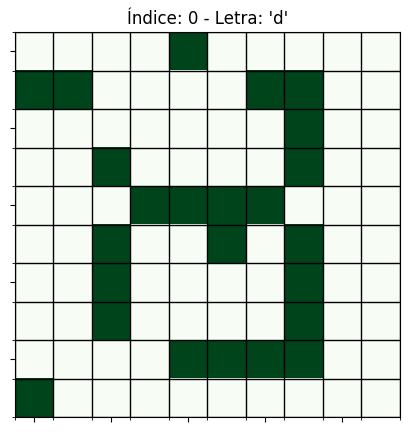

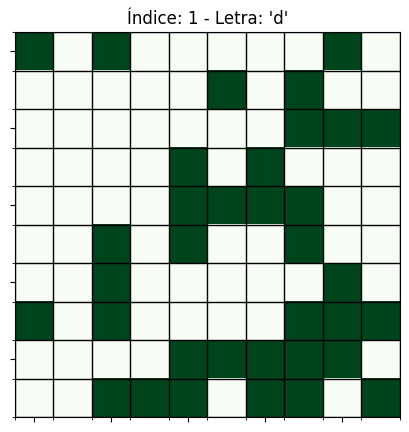

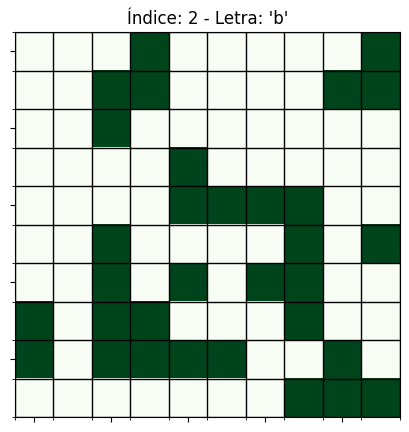

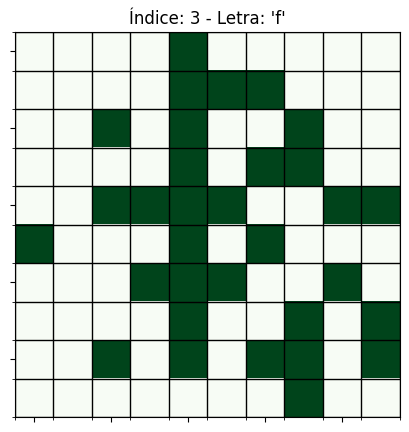

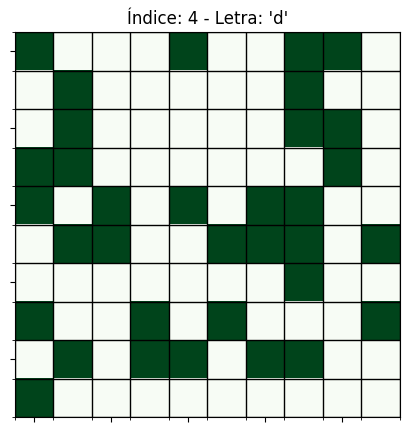

...

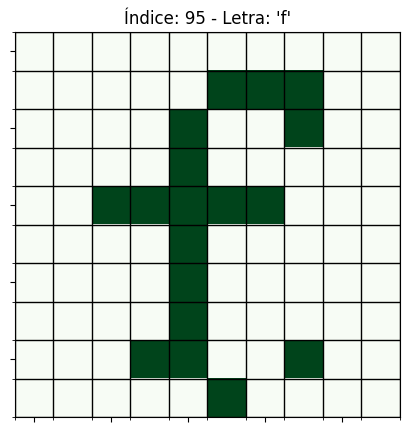

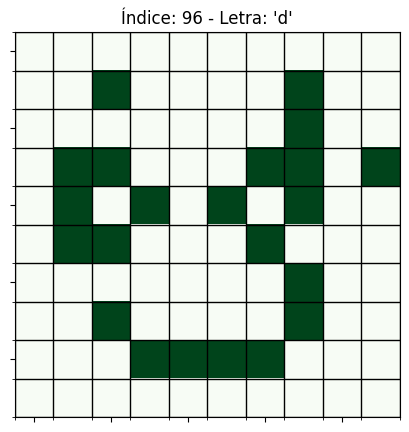

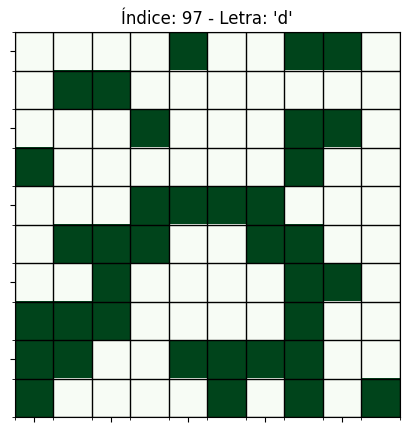

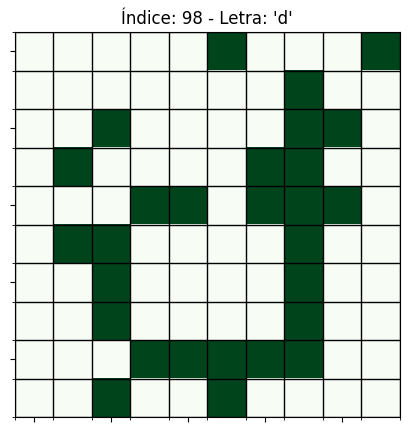

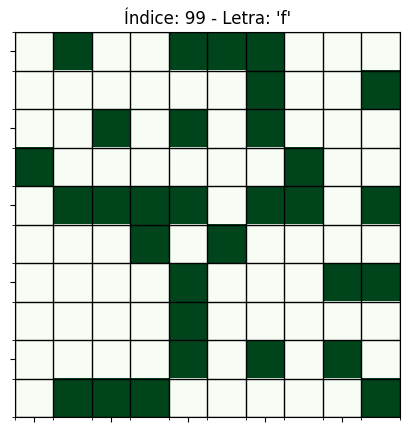

--- Visualización completada ---


In [ ]:
visualizar_dataset_interactivo(df_100_completo)


Iniciando visualización interactiva de 900 patrones.


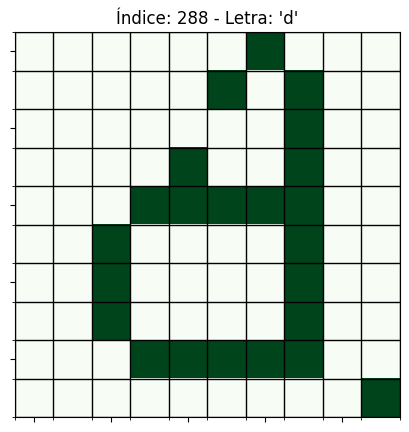

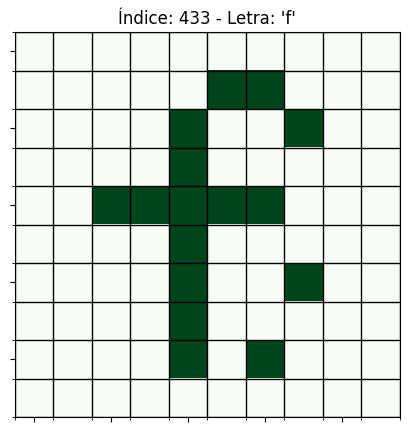

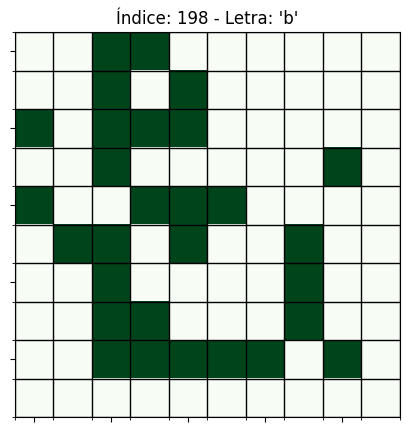

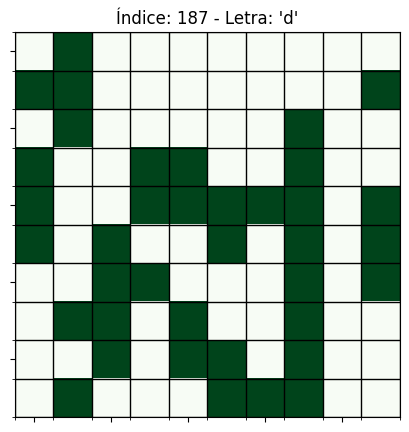

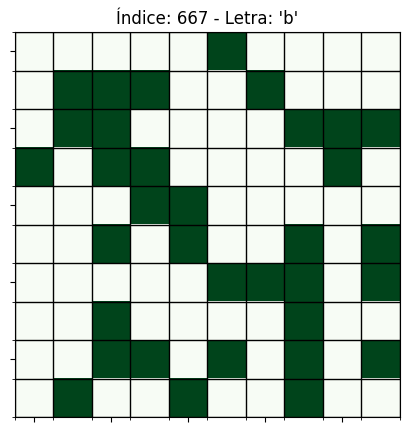

...

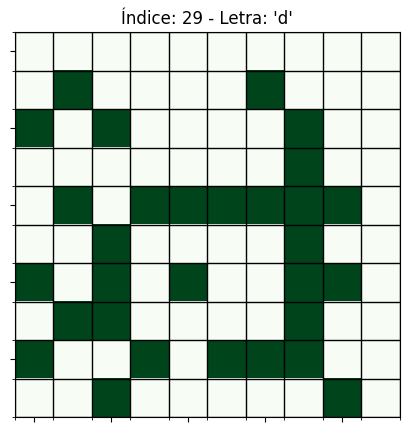

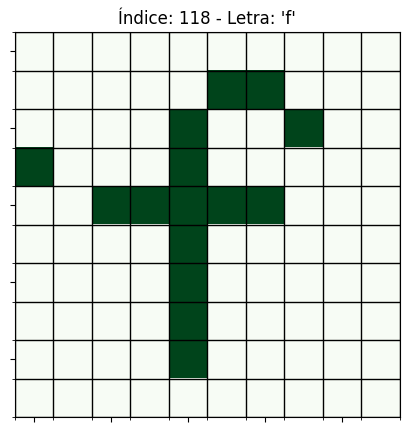

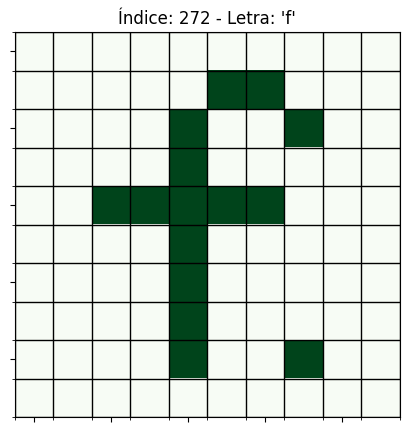

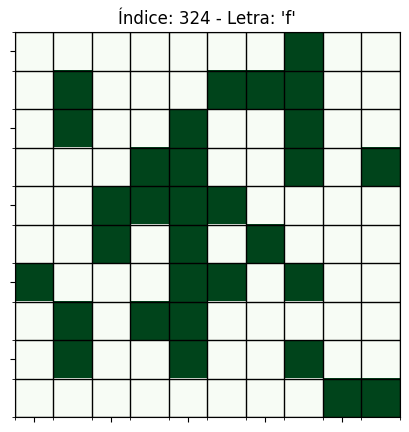

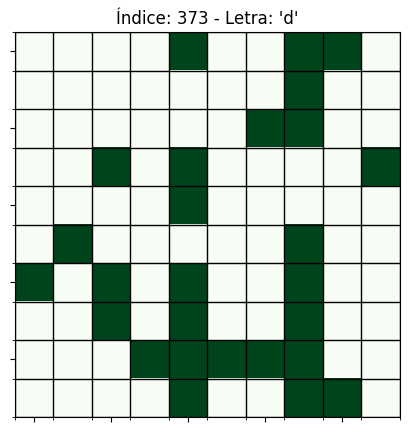

--- Visualización completada ---


In [ ]:
visualizar_dataset_interactivo(train_1000_A)


Iniciando visualización interactiva de 100 patrones.


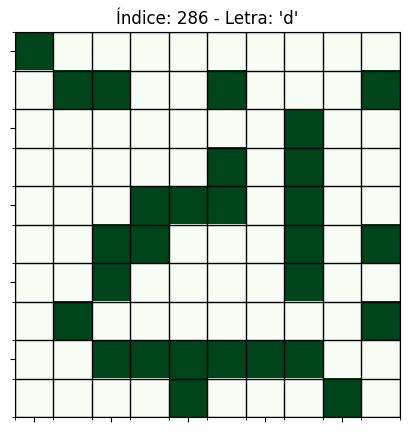

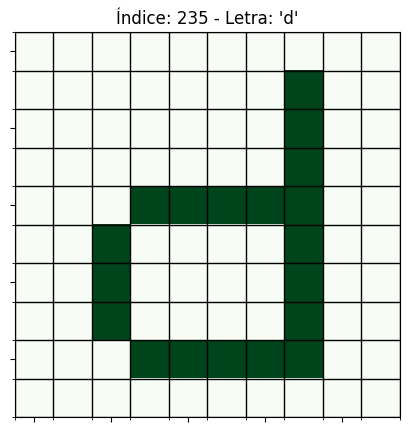

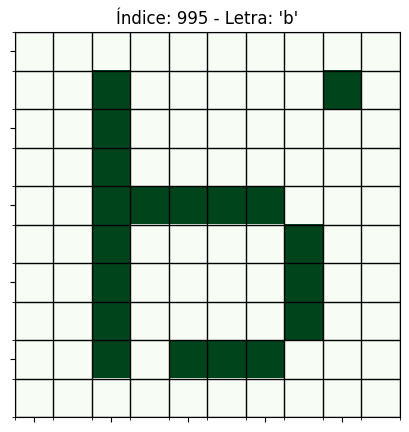

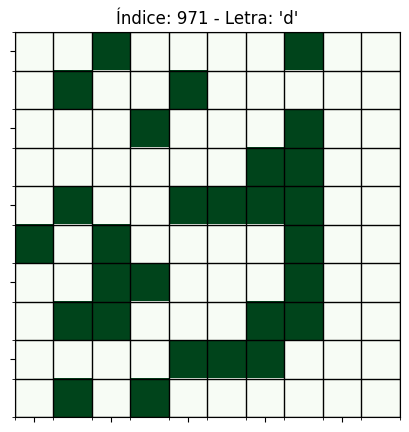

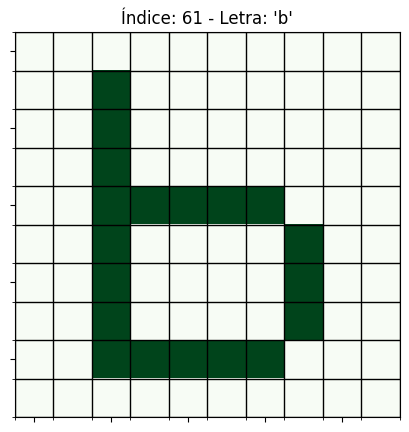

...

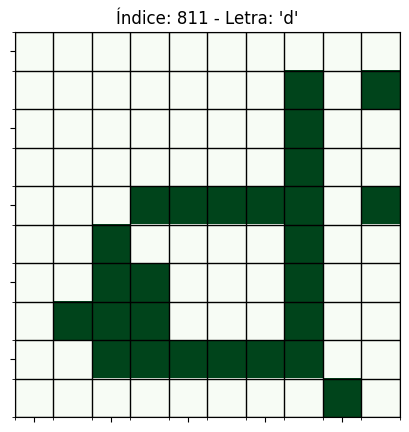

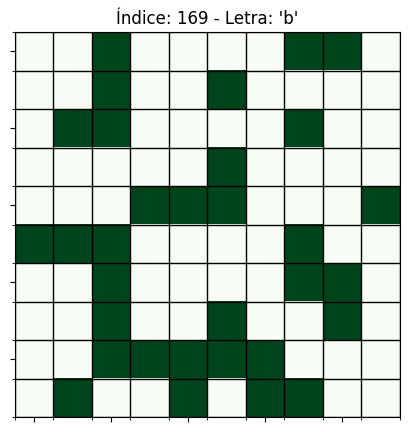

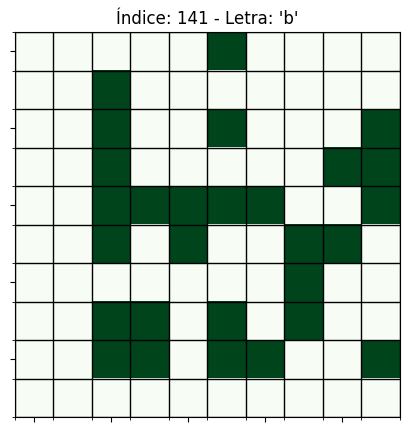

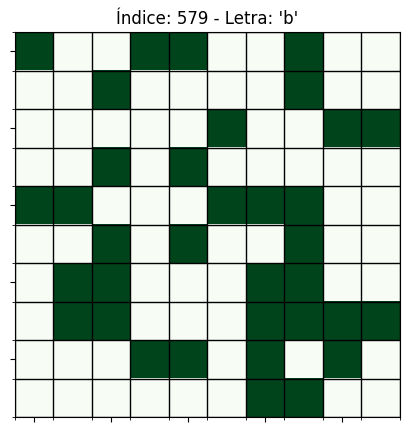

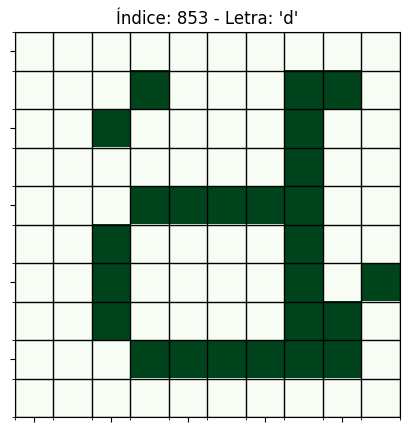

--- Visualización completada ---


In [ ]:
visualizar_dataset_interactivo(val_1000_A)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os

# --- 1. Definir la ruta base ---
# (Esta es la carpeta principal donde irán todos tus datasets)
base_save_path = '/content/drive/My Drive/TP_IA_2025/datasets'

# 2. Crear la carpeta base si no existe
os.makedirs(base_save_path, exist_ok=True)
print(f"Carpeta base de datasets: {base_save_path}")

# --- 3. Guardar los 3 datasets completos ---
# (Los guardamos en la carpeta base)
print("Guardando datasets completos...")
df_100_completo.to_csv(f"{base_save_path}/df_100_completo.csv", index=False)
df_500_completo.to_csv(f"{base_save_path}/df_500_completo.csv", index=False)
df_1000_completo.to_csv(f"{base_save_path}/df_1000_completo.csv", index=False)

# --- 4. Guardar las divisiones en sus carpetas ---

print("\nGuardando divisiones de 100...")
# Split 90/10
path_100_A = os.path.join(base_save_path, 'dataset_100', 'train90_val10')
os.makedirs(path_100_A, exist_ok=True)
train_100_A.to_csv(os.path.join(path_100_A, 'train.csv'), index=False)
val_100_A.to_csv(os.path.join(path_100_A, 'val.csv'), index=False)

# Split 80/20
path_100_B = os.path.join(base_save_path, 'dataset_100', 'train80_val20')
os.makedirs(path_100_B, exist_ok=True)
train_100_B.to_csv(os.path.join(path_100_B, 'train.csv'), index=False)
val_100_B.to_csv(os.path.join(path_100_B, 'val.csv'), index=False)

# Split 70/30
path_100_C = os.path.join(base_save_path, 'dataset_100', 'train70_val30')
os.makedirs(path_100_C, exist_ok=True)
train_100_C.to_csv(os.path.join(path_100_C, 'train.csv'), index=False)
val_100_C.to_csv(os.path.join(path_100_C, 'val.csv'), index=False)


print("Guardando divisiones de 500...")
# Split 90/10
path_500_A = os.path.join(base_save_path, 'dataset_500', 'train90_val10')
os.makedirs(path_500_A, exist_ok=True)
train_500_A.to_csv(os.path.join(path_500_A, 'train.csv'), index=False)
val_500_A.to_csv(os.path.join(path_500_A, 'val.csv'), index=False)

# Split 80/20
path_500_B = os.path.join(base_save_path, 'dataset_500', 'train80_val20')
os.makedirs(path_500_B, exist_ok=True)
train_500_B.to_csv(os.path.join(path_500_B, 'train.csv'), index=False)
val_500_B.to_csv(os.path.join(path_500_B, 'val.csv'), index=False)

# Split 70/30
path_500_C = os.path.join(base_save_path, 'dataset_500', 'train70_val30')
os.makedirs(path_500_C, exist_ok=True)
train_500_C.to_csv(os.path.join(path_500_C, 'train.csv'), index=False)
val_500_C.to_csv(os.path.join(path_500_C, 'val.csv'), index=False)


print("Guardando divisiones de 1000...")
# Split 90/10
path_1000_A = os.path.join(base_save_path, 'dataset_1000', 'train90_val10')
os.makedirs(path_1000_A, exist_ok=True)
train_1000_A.to_csv(os.path.join(path_1000_A, 'train.csv'), index=False)
val_1000_A.to_csv(os.path.join(path_1000_A, 'val.csv'), index=False)

# Split 80/20
path_1000_B = os.path.join(base_save_path, 'dataset_1000', 'train80_val20')
os.makedirs(path_1000_B, exist_ok=True)
train_1000_B.to_csv(os.path.join(path_1000_B, 'train.csv'), index=False)
val_1000_B.to_csv(os.path.join(path_1000_B, 'val.csv'), index=False)

# Split 70/30
path_1000_C = os.path.join(base_save_path, 'dataset_1000', 'train70_val30')
os.makedirs(path_1000_C, exist_ok=True)
train_1000_C.to_csv(os.path.join(path_1000_C, 'train.csv'), index=False)
val_1000_C.to_csv(os.path.join(path_1000_C, 'val.csv'), index=False)

print("\n¡Archivos guardados exitosamente en la nueva estructura de carpetas!")

Carpeta base de datasets: /content/drive/My Drive/TP_IA_2025/datasets
Guardando datasets completos...

Guardando divisiones de 100...
Guardando divisiones de 500...
Guardando divisiones de 1000...

¡Archivos guardados exitosamente en la nueva estructura de carpetas!



# Descripción de Datasets - TP Inteligencia Artificial 2025

Este documento explica la estructura de los archivos CSV generados y el método
utilizado para la generación y distorsión de los patrones.


1. ESTRUCTURA DE LOS ARCHIVOS CSV
---------------------------------

Cada archivo CSV (ej: "train.csv", "val.csv", "df_100_completo.csv")
representa un conjunto de patrones de letras.

Cada fila en el CSV corresponde a un único patrón (una letra) y contiene
101 columnas en total:

* Columnas `p0` a `p99` (100 columnas):
    * **Descripción**: Representan las características (features) del patrón.
    * **Contenido**: Son los 100 píxeles de la cuadrícula de 10x10,
        aplanados en una sola fila.
    * **Valores**:
        * `1`: Representa un píxel "activo" o "relleno" (verde en la imagen).
        * `0`: Representa un píxel "inactivo" o "vacío" (blanco en la imagen).

* Columna `letra` (1 columna):
    * **Descripción**: Esta es la etiqueta (target) que el modelo debe
        aprender a predecir.
    * **Contenido**: El carácter que representa el patrón.
    * **Valores**: 'b', 'd', o 'f'.


2. MÉTODO DE GENERACIÓN Y DISTORSIÓN
-------------------------------------

Los datasets se generaron siguiendo los requisitos especificados en el
trabajo práctico.

A. Generación del Dataset Completo:
-----------------------------------
Para cada dataset (de 100, 500 y 1000 ejemplos), la generación sigue
dos reglas:

1.  **Proporción Prístina/Distorsión**:
    * El **10%** de los patrones son "prístinos", es decir, son copias
        exactas de las plantillas base de las letras 'b', 'd' y 'f'.
    * El **90%** restante de los patrones son "distorsionados".

2.  **Distribución de Clases**:
    * Se mantiene una distribución de clases balanceada. En todo el
        dataset, aproximadamente 1/3 de los ejemplos corresponde a
        la letra 'b', 1/3 a la 'd' y 1/3 a la 'f'.
    * Esta proporción se respeta tanto en el subconjunto prístino
        como en el distorsionado.

Al final, todos los patrones generados (prístinos y distorsionados)
se mezclan (shuffle) de forma aleatoria para crear el dataset completo.


B. Método de Distorsión:
-------------------------
La distorsión se aplica únicamente al 90% de los patrones mencionados
anteriormente.

1.  **Porcentaje de Distorsión**: Para cada patrón a distorsionar,
    se elige un porcentaje de distorsión aleatorio en un rango
    entre **1% y 30%**.

2.  **Aplicación de Ruido**: Este porcentaje determina cuántos píxeles
    (de los 100 disponibles) se van a "voltear" (flip).
    * Los píxeles específicos a voltear se eligen aleatoriamente.
    * "Voltear" un píxel significa invertir su valor: si era `0`
        pasa a ser `1`, y si era `1` pasa a ser `0`.


C. División en Entrenamiento y Validación:
-------------------------------------------
Los datasets completos se dividen en conjuntos de entrenamiento (train)
y validación (val) usando el método de "división estratificada"
(stratify).

Esto garantiza que la proporción de 1/3 de cada letra ('b', 'd', 'f')
se mantenga lo más exacta posible tanto en el conjunto de
entrenamiento como en el de validación, cumpliendo con el requisito
de que los conjuntos sean "representativos".